In [ ]:
!pip install geopandas

     |████████████████████████████████| 1.0MB 5.3MB/s 
     |████████████████████████████████| 15.3MB 267kB/s 
     |████████████████████████████████| 6.5MB 30.5MB/s 


##**Importing Packages**

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon

ModuleNotFoundError: ignored

##**Functions for data cleaning**

In [ ]:
def clean_data_csv(filename):
  missing_values = ["n/a", "na", "--"]
  df = pd.read_csv(filename)
  print(df.isnull().sum())
  df = df.dropna()
  return df


def clean_data_json(filename):
  missing_values = ["n/a", "na", "--"]
  df = pd.read_json(filename)
  print(df.isnull().sum())
  df = df.dropna()
  return df



In [ ]:
Honey = clean_data_csv("honey.csv")

State                       0
Honey producing colonies    2
Yield per colony            0
Production                  0
Stocks December 15          0
Average price per pound     0
Value of production         0
Year                        0
dtype: int64


In [ ]:
Honey.head()

,State,Honey producing colonies,Yield per colony,Production,Stocks December 15,Average price per pound,Value of production,Year
0,AL,41.0,20.0,820.0,33.0,0.54,443.0,1989
1,AZ,78.0,45.0,3510.0,1158.0,0.55,1931.0,1989
2,AR,34.0,61.0,2074.0,249.0,0.47,975.0,1989
3,CA,560.0,34.0,19040.0,2857.0,0.49,9330.0,1989
4,CO,50.0,66.0,3300.0,495.0,0.54,1782.0,1989


In [ ]:
numbers = clean_data_csv("numbers.csv")
numbers.head()

State                                  0
October 1 colonies                     0
October-December Maximum colonies      0
October-December Lost colonies         0
October-December Percent lost          0
October-December Added colonies        0
October-December Renovated colonies    0
October-December Percent renovated     0
Year                                   0
dtype: int64


,State,October 1 colonies,October-December Maximum colonies,October-December Lost colonies,October-December Percent lost,October-December Added colonies,October-December Renovated colonies,October-December Percent renovated,Year
0,AL,7000,7000,1800,26,2800,250,4,2015-Q1
1,AZ,35000,35000,4600,13,3400,2100,6,2015-Q1
2,AR,13000,14000,1500,11,1200,90,1,2015-Q1
3,CA,1440000,1690000,255000,15,250000,124000,7,2015-Q1
4,CO,3500,12500,1500,12,200,140,1,2015-Q1


In [ ]:
stressors = clean_data_csv("stressors.csv")
stressors.head()

State                        0
Varroa mites                 0
Other pests and parasites    0
Diseases                     0
Pesticides                   0
Other                        0
Unknown                      0
Year                         0
dtype: int64


,State,Varroa mites,Other pests and parasites,Diseases,Pesticides,Other,Unknown,Year
0,AL,10.0,5.4,(Z),2.2,9.1,9.4,2015-Q1
1,AZ,26.9,20.5,0.1,(Z),1.8,3.1,2015-Q1
2,AR,17.6,11.4,1.5,3.4,1.0,1.0,2015-Q1
3,CA,24.7,7.2,3.0,7.5,6.5,2.8,2015-Q1
4,CO,14.6,0.9,1.8,0.6,2.6,5.9,2015-Q1


In [ ]:
neonic = clean_data_csv("vHoneyNeonic_v02.csv")
neonic.head()

state             0
numcol            0
yieldpercol       0
totalprod         0
stocks            0
priceperlb        0
prodvalue         0
year              0
StateName         0
Region            0
nCLOTHIANIDIN    64
nIMIDACLOPRID    64
nTHIAMETHOXAM    64
nACETAMIPRID     64
nTHIACLOPRID     64
nAllNeonic       64
dtype: int64


,state,numcol,yieldpercol,totalprod,stocks,priceperlb,prodvalue,year,StateName,Region,nCLOTHIANIDIN,nIMIDACLOPRID,nTHIAMETHOXAM,nACETAMIPRID,nTHIACLOPRID,nAllNeonic
0,AL,11000.0,56,616000.0,209000.0,1.49,918000.0,2007,Alabama,South,7696.2,3258.1,4149.6,0.0,0.0,15103.9
1,AL,11000.0,72,792000.0,230000.0,1.21,958000.0,2006,Alabama,South,680.0,4230.2,5371.6,0.0,0.0,10281.8
2,AL,12000.0,86,1032000.0,103000.0,1.18,1218000.0,2002,Alabama,South,0.0,1178.8,840.4,0.0,0.0,2019.2
3,AL,12000.0,87,1044000.0,282000.0,1.41,1472000.0,2004,Alabama,South,2676.4,1323.9,3863.9,0.0,0.0,7864.2
4,AL,13000.0,66,858000.0,266000.0,1.02,875000.0,2005,Alabama,South,1503.6,994.5,5493.9,0.0,0.0,7992.0


# **Exploratory Analysis**


## Bee Colony Loss
#### This section of the exploratory research analyses bee population numbers and deseased colonies as well as newly acquired ones in relationship with production levels

In [5]:
colony_loss = pd.read_excel('https://query.data.world/s/mrrirpl3nmlyjnjxbjjhvy3kxf4hhw')

In [6]:
colony_loss.columns = [col.replace('\xa0', '') for col in colony_loss.columns]
colony_loss = colony_loss.dropna()


In [7]:
colony_loss

,Year,Season,State,Total Annual Loss,Beekeepers,Beekeepers Exclusive to State,Colonies,Colonies Exclusive to State
0,2016/17,Annual,Massachusetts,0.159,87,0.943,27186,0.023
1,2016/17,Annual,Montana,0.171,21,0.524,35905,0.003
2,2016/17,Annual,Nevada,0.230,13,0.923,2512,0.052
3,2016/17,Annual,Maine,0.233,65,0.938,41102,0.014
4,2016/17,Annual,Wyoming,0.234,18,0.778,6521,0.014
...,...,...,...,...,...,...,...,...
355,2010/11,Annual,West Virginia,0.786,25,0.920,509,0.487
356,2010/11,Annual,Iowa,0.807,14,0.857,1037,0.688
357,2010/11,Annual,Michigan,0.835,99,0.970,10320,0.219
358,2010/11,Annual,Georgia,0.847,61,0.967,5923,0.208


**Transforming Year columns from '2016/17' to '2017'**

In [ ]:
colony_loss['Year'] = colony_loss['Year'].apply(lambda x: x[:2] + x[-2:]).astype(int)
colony_loss = colony_loss.sort_values('Year', ascending=True)

In [ ]:
colony_loss['Colonies Lost'] = colony_loss['Total Annual Loss'] * colony_loss['Colonies']

In [ ]:
yearly_colony_loss = colony_loss.groupby('Year')[['Colonies', 'Colonies Lost']].sum()
yearly_colony_loss = yearly_colony_loss.astype(int)
yearly_colony_loss['Colonies Acquired'] = yearly_colony_loss['Colonies'] - yearly_colony_loss['Colonies Lost']
yearly_colony_loss['Total Annual Loss'] = yearly_colony_loss['Colonies Lost'] / yearly_colony_loss['Colonies']
yearly_colony_loss = yearly_colony_loss.reset_index()
yearly_colony_loss

,Year,Colonies,Colonies Lost,Colonies Acquired,Total Annual Loss
0,2011,603574,221771,381803,0.367430
1,2012,694292,219336,474956,0.315913
2,2013,3006214,1410201,1596013,0.469095
3,2014,2750691,928581,1822110,0.337581
4,2015,2517608,1065320,1452288,0.423148
5,2016,2341662,987130,1354532,0.421551
6,2017,1640309,541317,1098992,0.330009


In [ ]:
neonic = clean_data_csv("vHoneyNeonic_v02.csv")
total_pesticide = neonic.groupby('year')[['nAllNeonic']].sum().reset_index()
total_pesticide = total_pesticide.rename({'year': 'Year', 'nAllNeonic': 'Pesticide Use'}, axis=1)

state             0
numcol            0
yieldpercol       0
totalprod         0
stocks            0
priceperlb        0
prodvalue         0
year              0
StateName         0
Region            0
nCLOTHIANIDIN    64
nIMIDACLOPRID    64
nTHIAMETHOXAM    64
nACETAMIPRID     64
nTHIACLOPRID     64
nAllNeonic       64
dtype: int64


Text(0.5, 1.0, 'Number of Colonies, Colonies Lost and Pesticide Use for the US between 2011 and 2016')

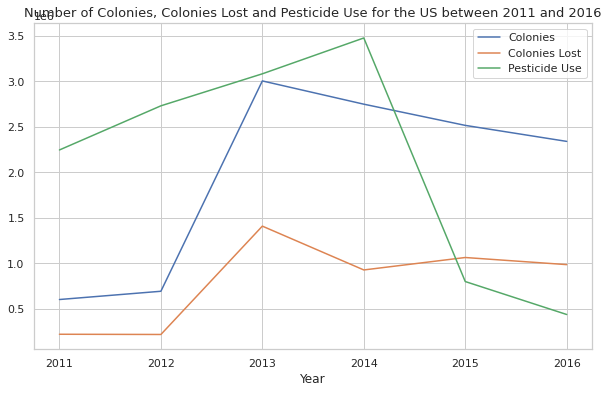

In [ ]:
trunc_yearly_colony_loss = yearly_colony_loss[yearly_colony_loss['Year'] < 2017]
total_pesticide = total_pesticide[total_pesticide['Year'] > 2010]

fig, ax = plt.subplots(figsize=(10, 6))

trunc_yearly_colony_loss.plot(x='Year', y='Colonies', ax=ax)
trunc_yearly_colony_loss.plot(x='Year', y='Colonies Lost', ax=ax)
total_pesticide.plot(x='Year', y='Pesticide Use', ax=ax)
ax.set_title('Number of Colonies, Colonies Lost and Pesticide Use for the US between 2011 and 2016', fontdict={'fontsize': '13', 'fontweight': '4'})

Text(0.5, 1.0, 'Number of Colonies Acquired (purchased / bred) for the US between 2011 and 2017')

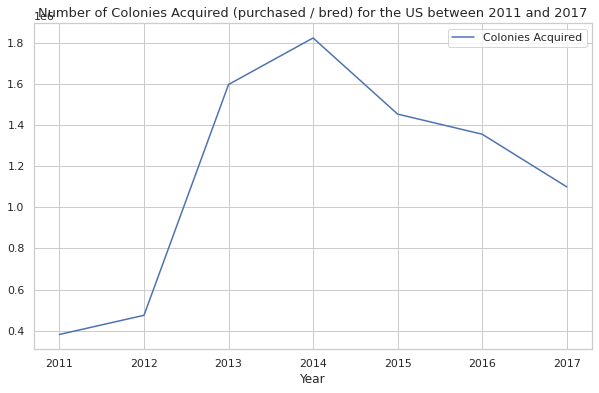

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
yearly_colony_loss.plot(x='Year', y='Colonies Acquired', ax=ax)
ax.set_title('Number of Colonies Acquired (purchased / bred) for the US between 2011 and 2017', fontdict={'fontsize': '13', 'fontweight': '4'})

**Only keep specific states (FL, ND, SD, CA) and convert each state column to use to char naming convention**

In [ ]:
state_mapping = {
  'Florida': 'FL',
  'North Dakota': 'ND',
  'South Dakota': 'SD',
  'California': 'CA'
}

colony_loss = colony_loss[colony_loss['State'].isin(state_mapping.keys())]
colony_loss['State'] = colony_loss['State'].map(state_mapping)

State                       0
Honey producing colonies    2
Yield per colony            0
Production                  0
Stocks December 15          0
Average price per pound     0
Value of production         0
Year                        0
dtype: int64


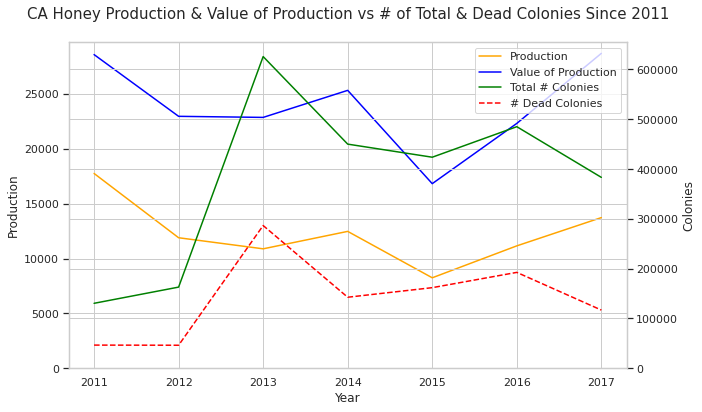

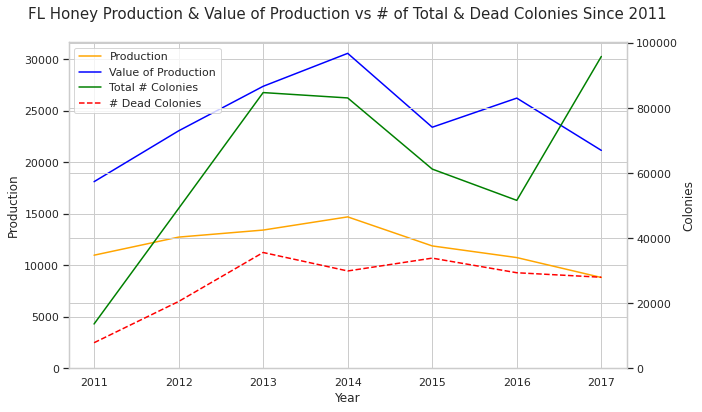

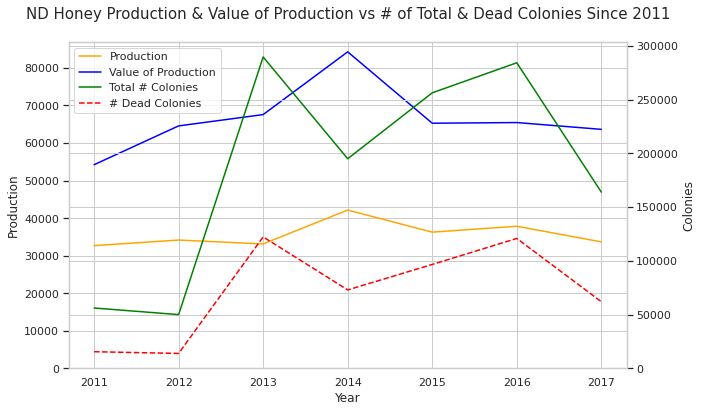

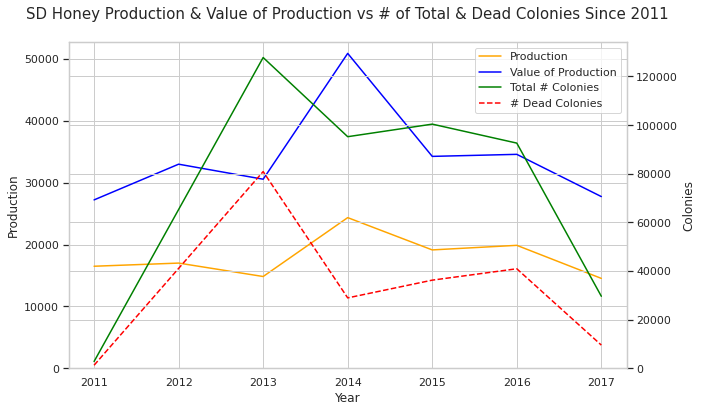

In [ ]:
honey = clean_data_csv("honey.csv")

def plot_state_honey_over_time(honey, colony_loss, state_code):
    state_specific = honey[honey['State'] == state_code]
    state_specific = state_specific[state_specific['Year'] < 2018]
    state_specific = state_specific[state_specific['Year'] > 2010]
    
    colony_loss = colony_loss[colony_loss['State'] == state_code]
  
    fig, ax = plt.subplots(figsize=(10, 6))

    sns.set_theme(style="whitegrid")
    sns.lineplot(x="Year", 
            y="Production", 
            data=state_specific, 
            ax=ax, 
            color="orange",
            label="Production")
    sns.lineplot(x="Year", 
            y="Value of production", 
            data=state_specific, 
            ax=ax, 
            color="blue",
            label="Value of Production")
    
    ax_right = ax.twinx()
    sns.lineplot(x='Year',
                 y='Colonies',
                 data=colony_loss,
                 color='green',
                 ax=ax_right,
                 label='Total # Colonies')
    sns.lineplot(x='Year',
                 y='Colonies Lost',
                 data=colony_loss,
                 color='red',
                 ax=ax_right,
                 label='# Dead Colonies')
    ax_right.lines[-1].set_linestyle("--")
    
    ax.set_ylim(0)
    ax_right.set_ylim(0)

    title = state_code + " Honey Production & Value of Production vs # of Total & Dead Colonies Since 2011\n"
    ax.set_title(title, fontdict={'fontsize': '15', 'fontweight': '4'})

    handles,labels = [],[]
    for ax in fig.axes:
        for h,l in zip(*ax.get_legend_handles_labels()):
            handles.append(h)
            labels.append(l)
        ax.legend_.remove()
        
    plt.legend(handles,labels)
    plt.show()

plot_state_honey_over_time(honey, colony_loss, 'CA')
plot_state_honey_over_time(honey, colony_loss, 'FL')
plot_state_honey_over_time(honey, colony_loss, 'ND')
plot_state_honey_over_time(honey, colony_loss, 'SD')

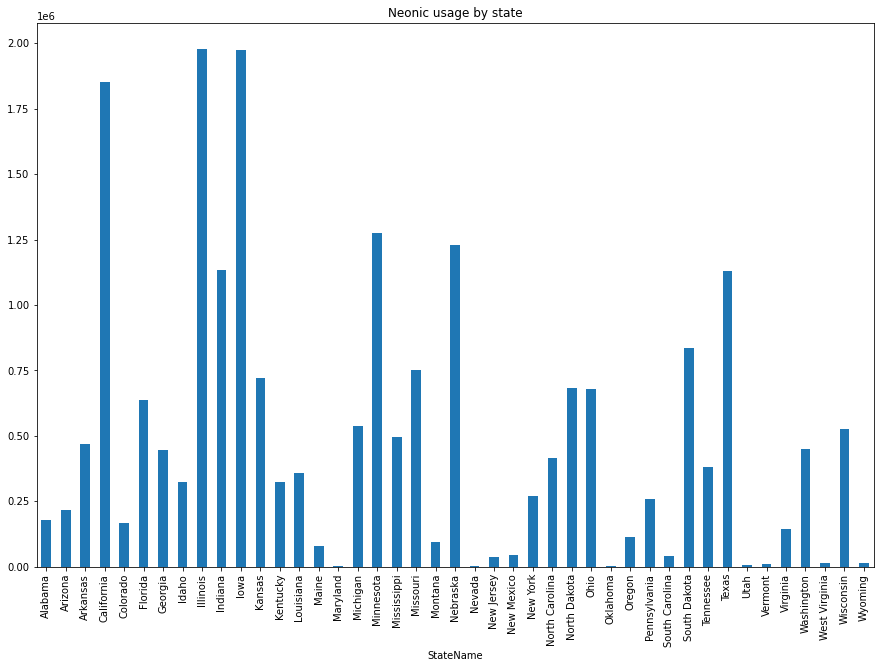

In [ ]:
neonic.groupby(['StateName'])['nAllNeonic'].sum().plot(kind='bar')
plt.title("Neonic usage by state")
plt.rcParams["figure.figsize"] = (15, 10)
plt.rcParams["xtick.labelsize"] = 10
plt.rcParams["ytick.labelsize"] = 10

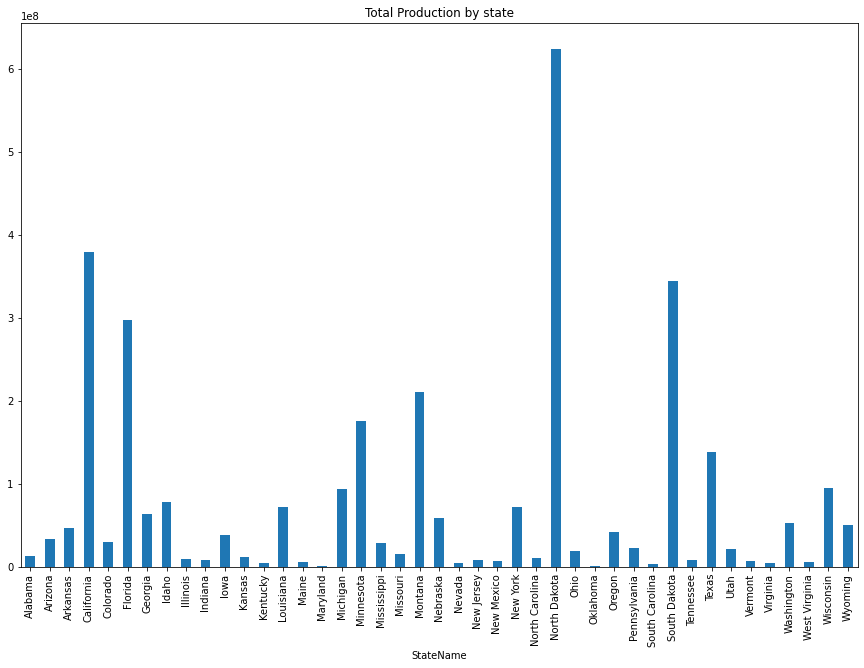

In [ ]:
neonic.groupby(['StateName'])['totalprod'].sum().plot(kind='bar')
plt.title("Total Production by state")
plt.rcParams["figure.figsize"] = (20, 15)
plt.rcParams["xtick.labelsize"] = 10
plt.rcParams["ytick.labelsize"] = 10

**Production Trends for Top States**

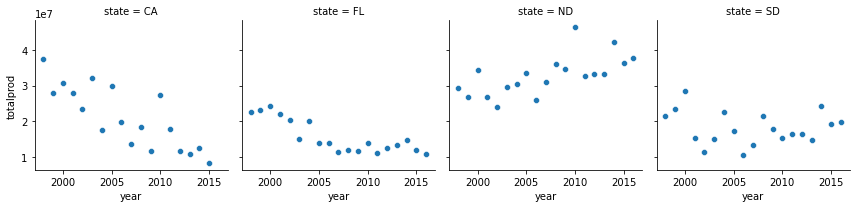

In [ ]:
states = neonic[((neonic['state'] == 'CA') | (neonic['state'] == 'FL') | (neonic['state'] == 'ND') | (neonic['state'] == 'SD'))]
s = sns.FacetGrid(states,col = "state",col_wrap=4)
s.map(sns.scatterplot,"year","totalprod")

**Basic Graph of Honey data for CA, ND, SD, and FL**

State                       0
Honey producing colonies    2
Yield per colony            0
Production                  0
Stocks December 15          0
Average price per pound     0
Value of production         0
Year                        0
dtype: int64
state             0
numcol            0
yieldpercol       0
totalprod         0
stocks            0
priceperlb        0
prodvalue         0
year              0
StateName         0
Region            0
nCLOTHIANIDIN    64
nIMIDACLOPRID    64
nTHIAMETHOXAM    64
nACETAMIPRID     64
nTHIACLOPRID     64
nAllNeonic       64
dtype: int64


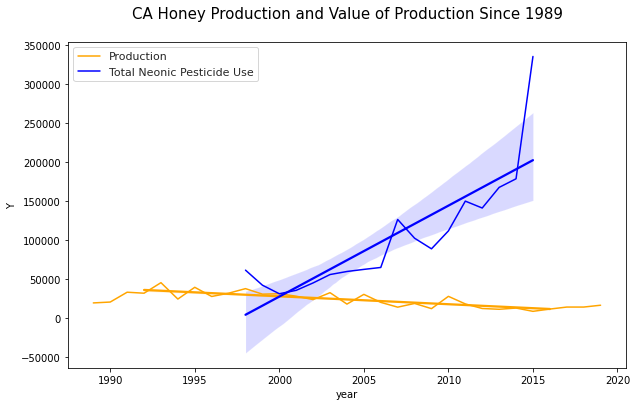

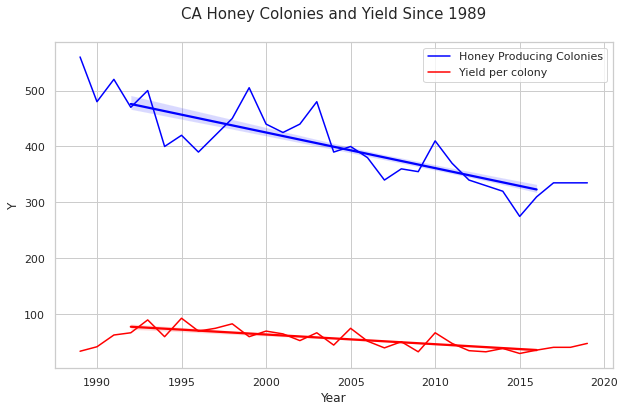

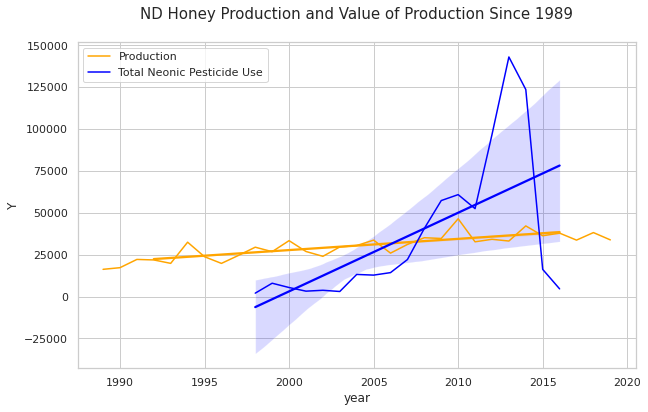

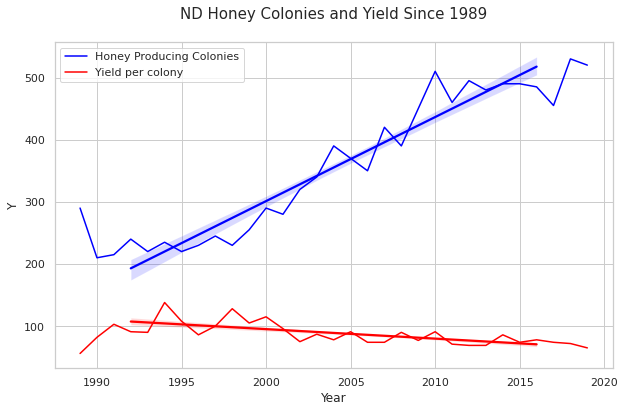

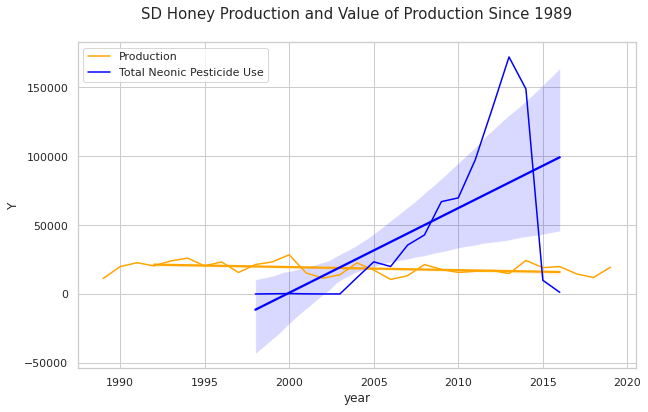

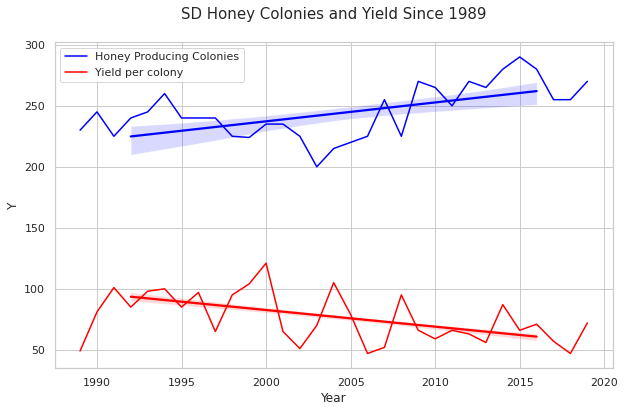

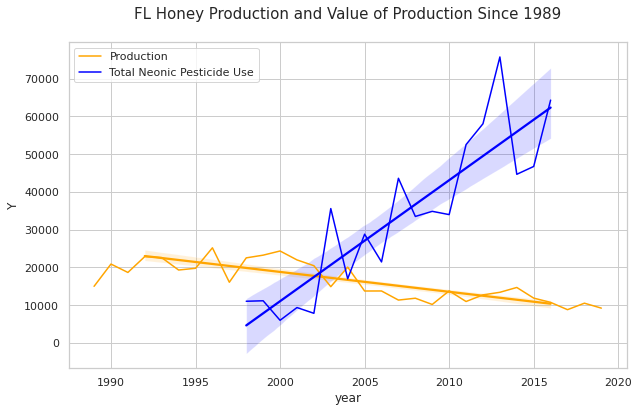

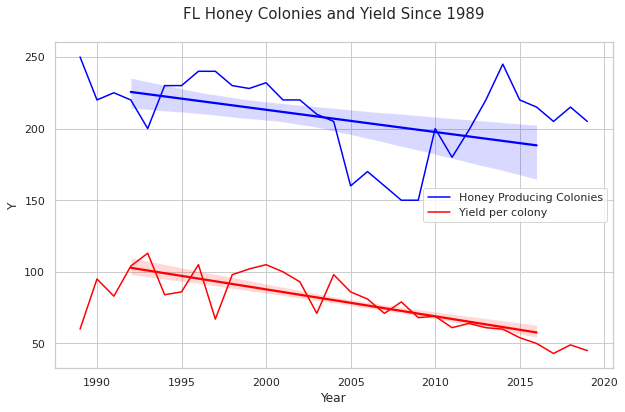

In [ ]:
honey = clean_data_csv("honey.csv")
neonic = clean_data_csv("vHoneyNeonic_v02.csv")

def plot_state_honey_over_time(honey, neonic, state_code):
    state_specific = honey[honey['State'] == state_code]
    neonic = neonic[neonic['state'] == state_code]

    data = state_specific.rolling(7).mean()
    fig, ax = plt.subplots(1, figsize=(10, 6))

    sns.set_theme(style="whitegrid")
    sns.lineplot(x="Year", 
            y="Production", 
            data=state_specific, 
            ax=ax, 
            color="orange",
            label="Production")
    sns.regplot(x = "Year",
            y = "Production",
            data = data,
            dropna = True,
            ax=ax,
            scatter=False,
            color='orange')
    sns.lineplot(x="year", y="nAllNeonic", data=neonic, ax=ax, color="blue",
            label="Total Neonic Pesticide Use")
    sns.regplot(x = "year",
            y = "nAllNeonic",
            data = neonic,
            dropna = True,
            ax=ax,
            scatter=False,
            color='blue')
    title = state_code + " Honey Production and Value of Production Since 1989\n"
    ax.set_title(title, fontdict={'fontsize': '15', 'fontweight': '4'})
    plt.ylabel("Y")
    plt.show()

    fig, ax = plt.subplots(1, figsize=(10, 6))
    sns.lineplot(x="Year", 
            y="Honey producing colonies", 
            data=state_specific, 
            ax=ax, 
            color='blue',
            label='Honey Producing Colonies')
    sns.regplot(x = "Year",
            y = "Honey producing colonies",
            data = data,
            dropna = True,
            ax=ax,
            scatter=False,
            color='blue')
    sns.lineplot(x="Year", 
            y="Yield per colony", 
            data=state_specific, 
            ax=ax, 
            color='red',
            label='Yield per colony')
    sns.regplot(x = "Year",
            y = "Yield per colony",
            data = data,
            dropna = True,
            ax=ax,
            scatter=False,
            color='red')
    title = state_code + " Honey Colonies and Yield Since 1989\n"
    ax.set_title(title, fontdict={'fontsize': '15', 'fontweight': '4'})
    plt.ylabel("Y")
    plt.show()


plot_state_honey_over_time(honey, neonic, 'CA')
plot_state_honey_over_time(honey, neonic, 'ND')
plot_state_honey_over_time(honey, neonic, 'SD')
plot_state_honey_over_time(honey, neonic, 'FL')

**Pesticide Use by Year**

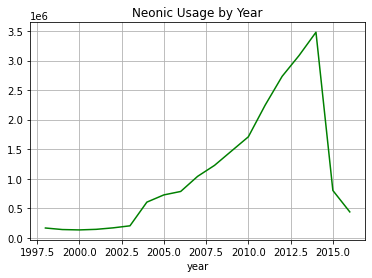

In [ ]:
neonic.groupby(['year'])['nAllNeonic'].sum().plot(color='green')
plt.title("Neonic Usage by Year")
plt.grid()

**Breakdown of Pesticide Types by Year**

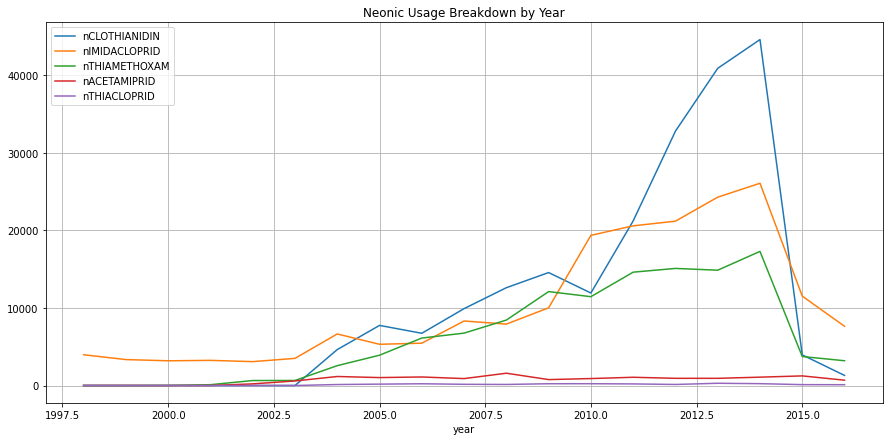

In [ ]:
data_by_year = neonic.groupby('year').mean()
data_by_year[['nCLOTHIANIDIN', 'nIMIDACLOPRID', 'nTHIAMETHOXAM', 'nACETAMIPRID','nTHIACLOPRID']].plot(ax=plt.subplots(figsize=(15,7))[1])
plt.title('Neonic Usage Breakdown by Year')
plt.grid()

**State Pesticide Usage**

## Neonic Pesticide Use Analysis
#### General summary plots that explore the neonic data set in order to identify general trends in honey bee production and the effects of pesticides

**Correlation analysis of value factors**

**Segmenting part of neonic data to extract certain features to analyze for correlation**

Text(0.5, 0.98, 'Pairplot of Bee Colony Information and Price Values')

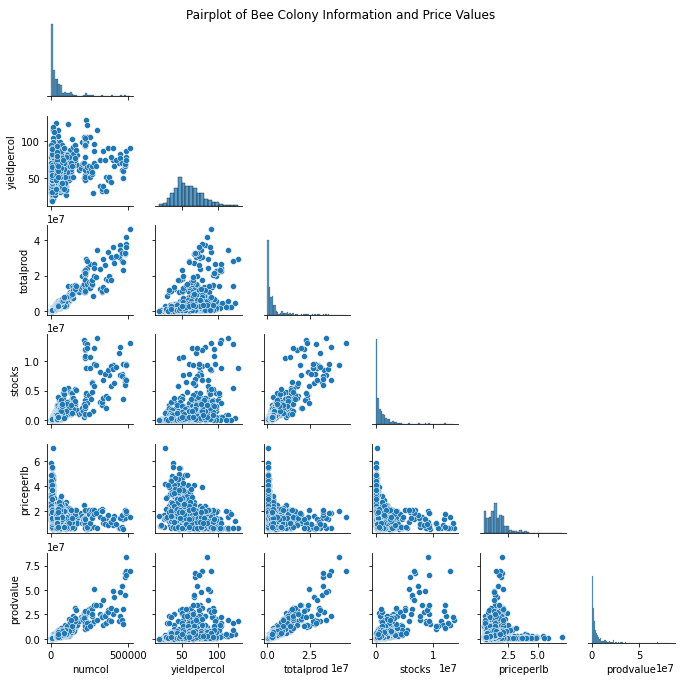

In [ ]:
neonic_corr = neonic.iloc[:,1:7]
g = sns.pairplot(neonic_corr,height = 1.6,corner = True)
g.fig.suptitle('Pairplot of Bee Colony Information and Price Values')

**Creating heatmap with the same features as above in pairplot to look at specific correlation levels**

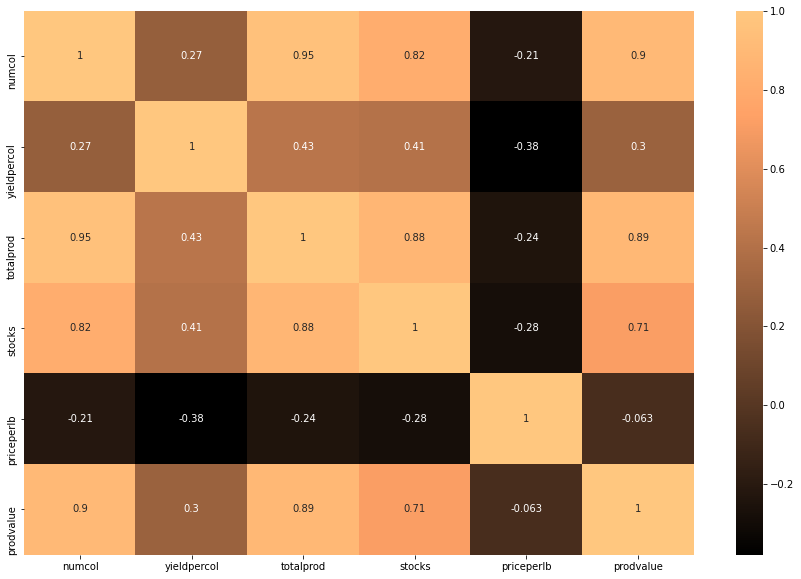

In [ ]:
plt.figure(figsize=(15,10))
sns.heatmap(neonic_corr.corr(),annot = True,cmap="copper")


**Colonies by Year**

Text(0.5, 1.0, 'Number of bee colonies by year')

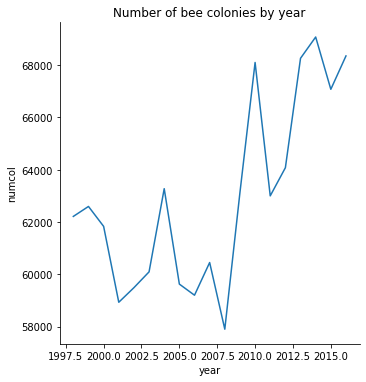

In [ ]:
sns.relplot(x="year", y="numcol", ci=None, kind="line", data=neonic)
plt.title('Number of bee colonies by year')

**Honey Production by Year**

Text(0.5, 1.0, 'Honey Production by Year')

<Figure size 1080x720 with 0 Axes>

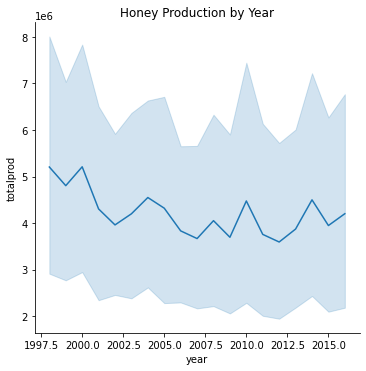

In [ ]:
plt.figure(figsize=(15,10))
production_over_years = sns.relplot(x="year", y="totalprod", kind="line", data=neonic)
plt.title('Honey Production by Year')

**Value of Honey by Year**

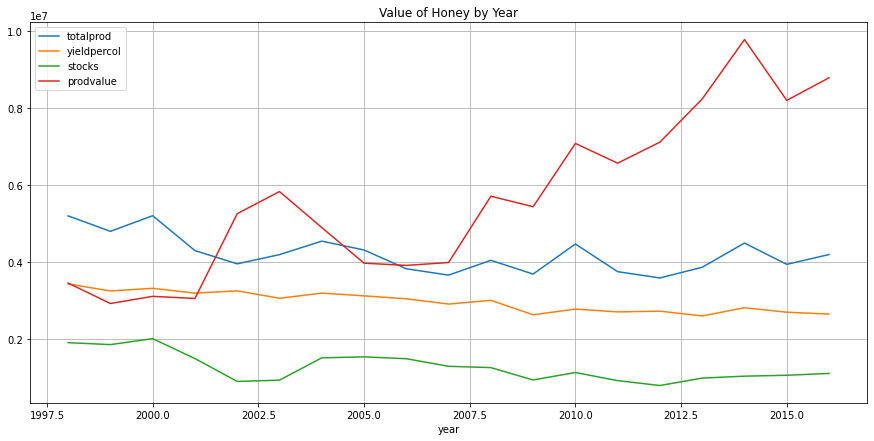

In [ ]:
data_by_year = neonic.groupby('year').mean() #grouping data by year
data_by_year['yieldpercol'] = 50000*data_by_year['yieldpercol']
data_by_year[['totalprod', 'yieldpercol', 'stocks', 'prodvalue']].plot(ax=plt.subplots(figsize=(15,7))[1])
plt.title('Value of Honey by Year')
plt.grid()

**Geopandas Visualization of Honey Since 1989**




State                       0
Honey producing colonies    2
Yield per colony            0
Production                  0
Stocks December 15          0
Average price per pound     0
Value of production         0
Year                        0
dtype: int64


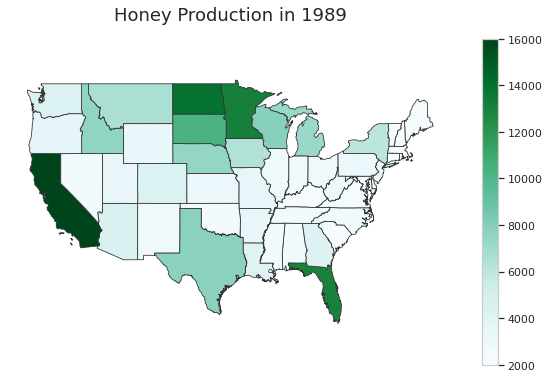

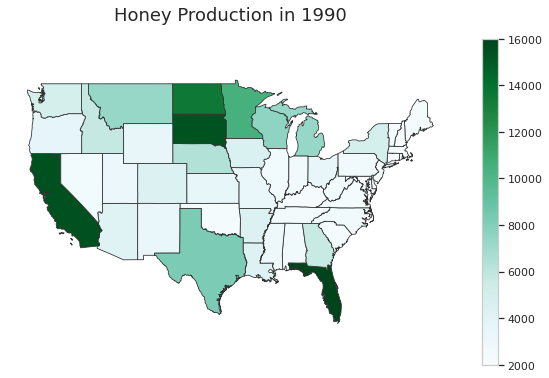

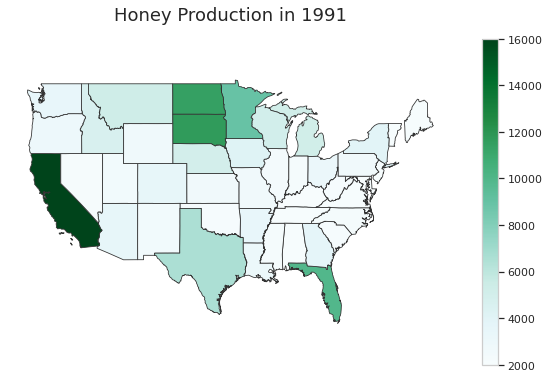

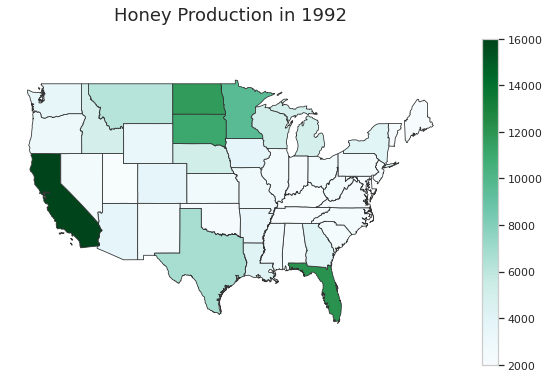

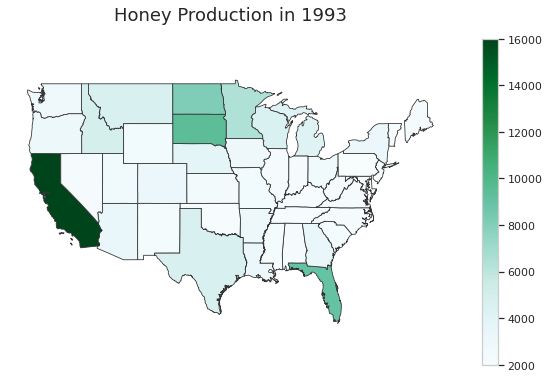

...

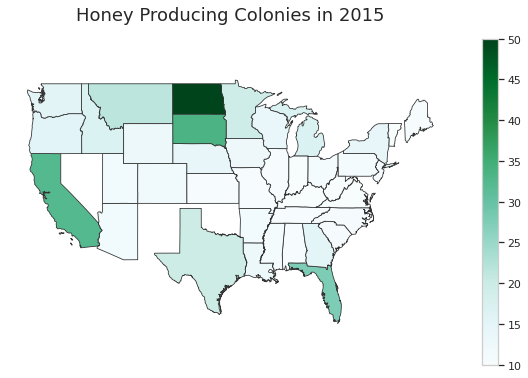

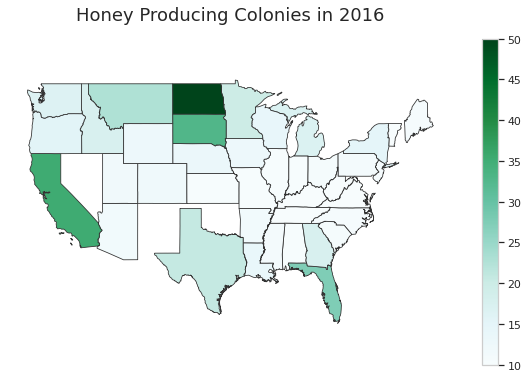

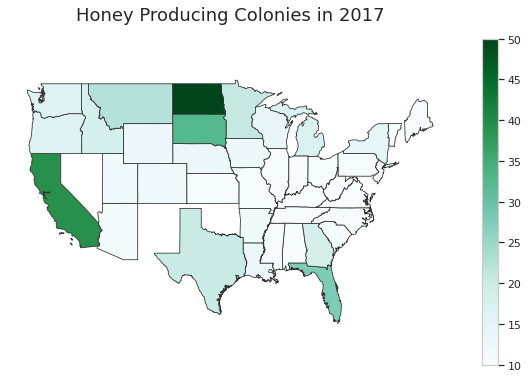

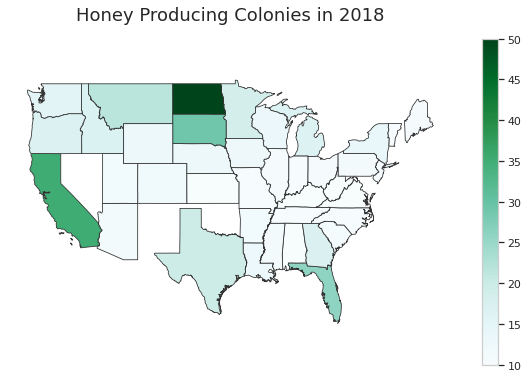

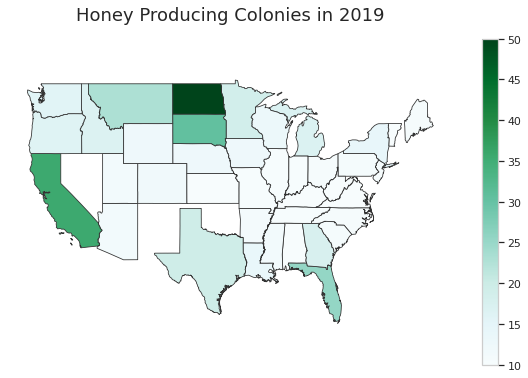

In [ ]:
honey = clean_data_csv("honey.csv")
USA_MAP_DATA = gpd.read_file('States_shapefile.shp')

def visualize_us_map(yearly_data, var, g_title, min, max):
    states = yearly_data.State.unique()
    merged = USA_MAP_DATA.set_index('State_Code').join(yearly_data.set_index('State'))

    fig, ax = plt.subplots(1, figsize=(10, 6))
    merged.plot(column=var, cmap='BuGn', linewidth=0.8, ax=ax, edgecolor='.2')

    ax.axis('off')
    title = g_title + ' in ' + str(int(merged['Year'].iloc[0])) + '\n\n'
    ax.set_title(title, fontdict={'fontsize': '18', 'fontweight': '3'})

    side = plt.cm.ScalarMappable(cmap='BuGn', norm=plt.Normalize(vmin=min, vmax=max))
    side._A = []
    sidebar = fig.colorbar(side)

    plt.show()

for year in honey.Year.unique():
        rows_wrong_year = honey[(honey['Year'] != year)].index
        yearly_subset = honey.drop(rows_wrong_year)

        drop_HI = yearly_subset[(yearly_subset['State'] == 'HI') | (yearly_subset['State'] == 'US')].index
        yearly_subset = yearly_subset.drop(drop_HI)
        visualize_us_map(yearly_subset, 'Production', 'Honey Production', 2000, 16000)

for year in honey.Year.unique():
        rows_wrong_year = honey[(honey['Year'] != year)].index
        yearly_subset = honey.drop(rows_wrong_year)

        drop_HI = yearly_subset[(yearly_subset['State'] == 'HI') | (yearly_subset['State'] == 'US')].index
        yearly_subset = yearly_subset.drop(drop_HI)
        visualize_us_map(yearly_subset, 'Honey producing colonies', 'Honey Producing Colonies', 10, 50)

**Total Production by State**

# **Correlation Analysis**

**Honey Production and Yield Per Colony Correlation with Neonic Pesticide Use by State**

State                       0
Honey producing colonies    2
Yield per colony            0
Production                  0
Stocks December 15          0
Average price per pound     0
Value of production         0
Year                        0
dtype: int64
state             0
numcol            0
yieldpercol       0
totalprod         0
stocks            0
priceperlb        0
prodvalue         0
year              0
StateName         0
Region            0
nCLOTHIANIDIN    64
nIMIDACLOPRID    64
nTHIAMETHOXAM    64
nACETAMIPRID     64
nTHIACLOPRID     64
nAllNeonic       64
dtype: int64


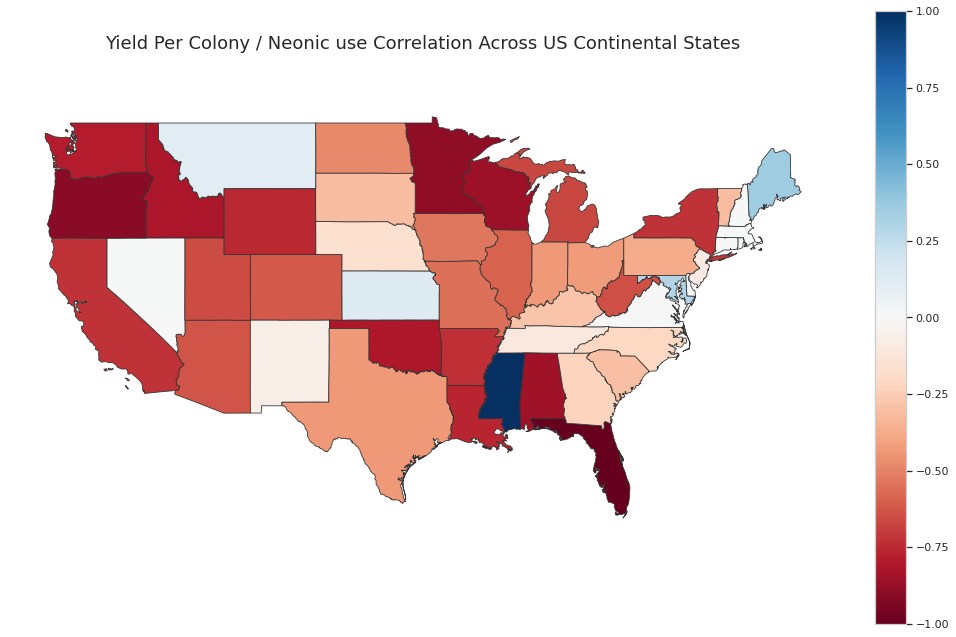

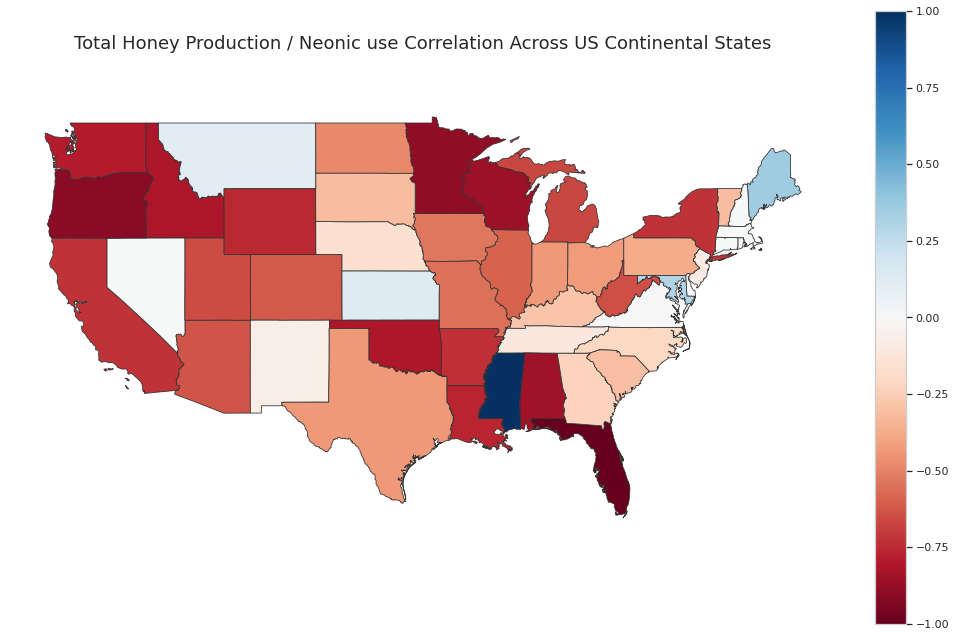

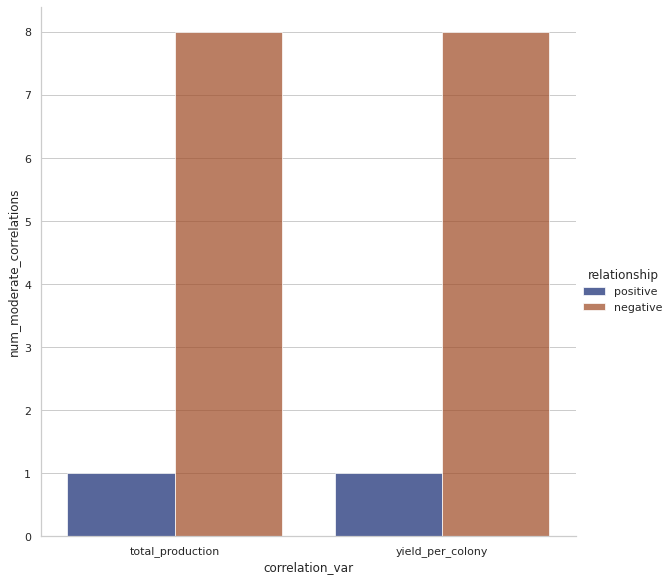

In [ ]:
honey = clean_data_csv("honey.csv")
neonic = clean_data_csv("vHoneyNeonic_v02.csv")
USA_MAP_DATA = gpd.read_file('States_shapefile.shp')

# as we saw in previous exploration graphs, neonic use was high between 1990s and 2015
rows_wrong_years = neonic[(neonic['year'] < 1995) | (neonic['year'] > 2015)].index
high_neonic_years = neonic.drop(rows_wrong_years)

HI_AND_AK = USA_MAP_DATA[(USA_MAP_DATA['FID'] == 2) | (USA_MAP_DATA['FID'] == 12)].index
USA_MAP_DATA = USA_MAP_DATA.drop(HI_AND_AK)

# calculate pesticide use correlation between 1996-2014 for each state and 
# append to geospacial dataframe for visualization
yield_correlations = []
y_num_neg_corr = 0;
y_num_pos_corr = 0;
prod_correlations = []
p_num_neg_corr = 0;
p_num_pos_corr = 0;
for state in USA_MAP_DATA.State_Code:
  non_matching_rows = high_neonic_years[high_neonic_years['state'] != state].index
  state_specific = high_neonic_years.drop(non_matching_rows)
  y_corr_val = state_specific['yieldpercol'].corr(state_specific['nAllNeonic'])
  p_corr_val = state_specific['totalprod'].corr(state_specific['nAllNeonic'])
  yield_correlations.append(y_corr_val)
  prod_correlations.append(p_corr_val)
  if y_corr_val < -.7:
    y_num_neg_corr += 1
  elif y_corr_val > .7:
    y_num_pos_corr += 1
  if p_corr_val < -.7:
    p_num_neg_corr += 1
  elif p_corr_val > .7:
    p_num_pos_corr += 1

USA_MAP_DATA['y_correlation'] = yield_correlations
USA_MAP_DATA['p_correlation'] = prod_correlations
USA_MAP_DATA = USA_MAP_DATA.fillna(0)

fig, ax = plt.subplots(1, figsize=(13, 9))
USA_MAP_DATA.plot(column='y_correlation', cmap='RdBu', linewidth=0.8, ax=ax, edgecolor='.2')

ax.axis('off')
title = 'Yield Per Colony / Neonic use Correlation Across US Continental States\n\n'
ax.set_title(title, fontdict={'fontsize': '18', 'fontweight': '3'})

side = plt.cm.ScalarMappable(cmap='RdBu', norm=plt.Normalize(vmin=-1, vmax=1))
side._A = []
fig.tight_layout()
sidebar = fig.colorbar(side, fraction=0.046, pad=0.04)

fig, ax = plt.subplots(1, figsize=(13, 9))
USA_MAP_DATA.plot(column='y_correlation', cmap='RdBu', linewidth=0.8, ax=ax, edgecolor='.2')

ax.axis('off')
title = 'Total Honey Production / Neonic use Correlation Across US Continental States\n\n'
ax.set_title(title, fontdict={'fontsize': '18', 'fontweight': '3'})

side = plt.cm.ScalarMappable(cmap='RdBu', norm=plt.Normalize(vmin=-1, vmax=1))
side._A = []
fig.tight_layout()
sidebar = fig.colorbar(side, fraction=0.046, pad=0.04)

sns.set_theme(style='whitegrid')

data = {
          'correlation_var':           ['total_production','total_production','yield_per_colony','yield_per_colony'],
          'num_moderate_correlations': [p_num_pos_corr, p_num_neg_corr, y_num_pos_corr, y_num_neg_corr],
          'relationship':              ['positive', 'negative','positive', 'negative']
       }
#Number of States with Moderate or Strong Yield Correlation
#Number of States with Moderate or Strong Production Correlation
num_corr_df = pd.DataFrame(data=data)

sns.catplot(data=num_corr_df, kind='bar', x='correlation_var', 
            y='num_moderate_correlations', hue='relationship',
            palette='dark', alpha=.7, height=8)


**Regional Correlation between Neonic Pesticide Use and Honey Production**

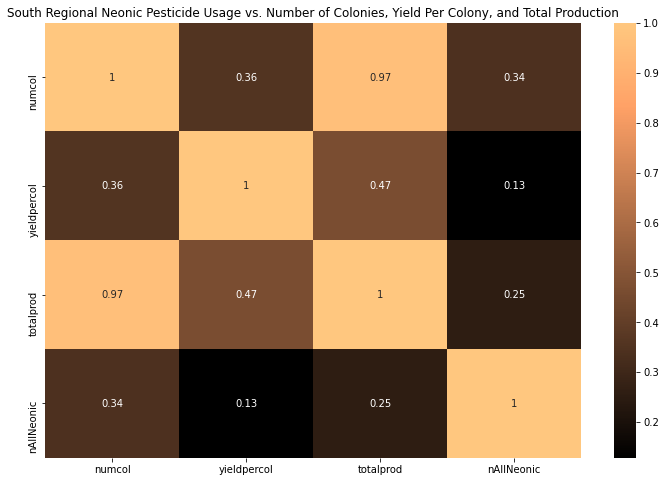

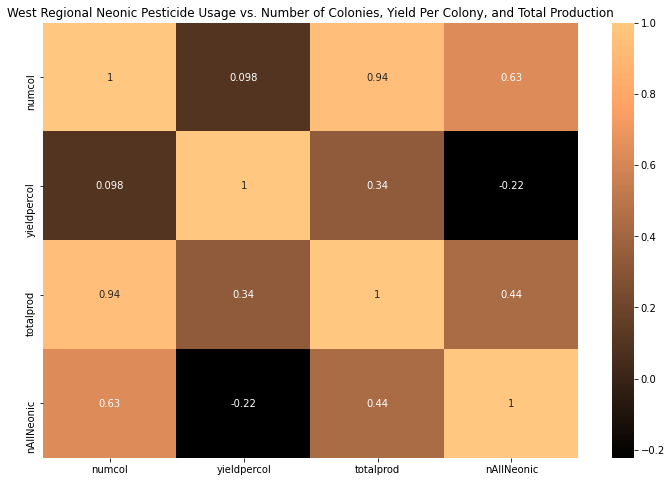

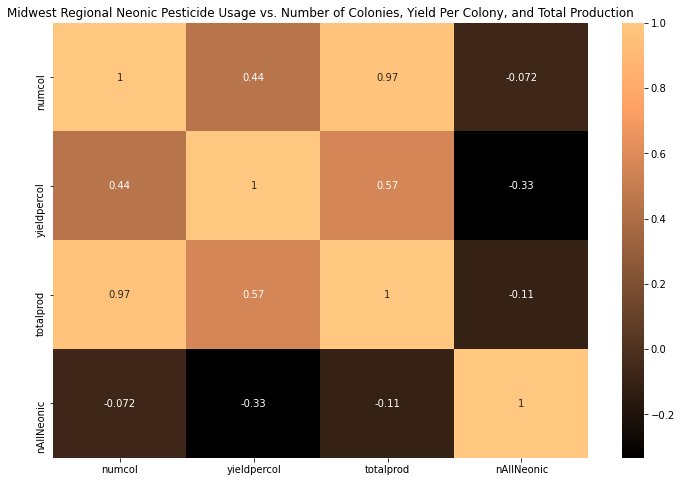

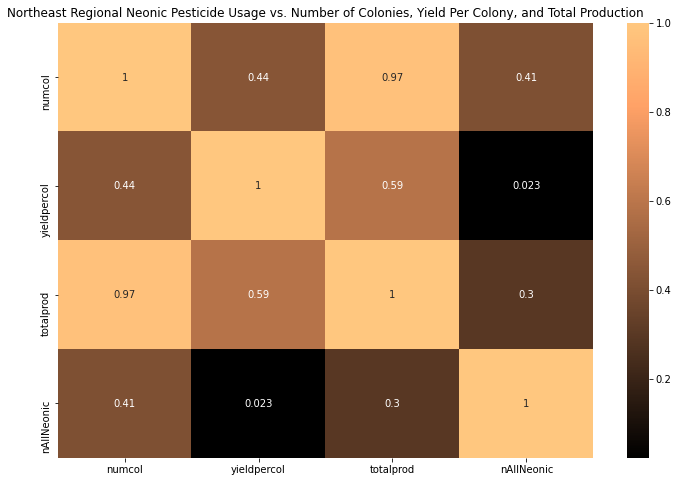

In [ ]:
reg_corr_df = neonic.copy()

rows_wrong_years = reg_corr_df[(reg_corr_df['year'] < 1995) | (reg_corr_df['year'] > 2015)].index
reg_corr_df = reg_corr_df.drop(rows_wrong_years)

for region in reg_corr_df.Region.unique():
  non_region = reg_corr_df[reg_corr_df['Region'] != region].index
  region_corr_df = reg_corr_df.drop(non_region)
  region_corr_df = region_corr_df[['numcol','yieldpercol','totalprod','nAllNeonic']]

  plt.figure(figsize=(12,8))
  heatmap = sns.heatmap(region_corr_df.corr(),annot = True,cmap="copper")
  heatmap.set_title(region + ' Regional Neonic Pesticide Usage vs. Number of Colonies, Yield Per Colony, and Total Production')



### **Country level regression analysis**

**Number of colonies vs. All Neonic Pesticides Usage**

In [ ]:
import scipy.stats as stats

neonic = clean_data_csv("vHoneyNeonic_v02.csv")
neonic.corr()

state             0
numcol            0
yieldpercol       0
totalprod         0
stocks            0
priceperlb        0
prodvalue         0
year              0
StateName         0
Region            0
nCLOTHIANIDIN    64
nIMIDACLOPRID    64
nTHIAMETHOXAM    64
nACETAMIPRID     64
nTHIACLOPRID     64
nAllNeonic       64
dtype: int64


,numcol,yieldpercol,totalprod,stocks,priceperlb,prodvalue,year,nCLOTHIANIDIN,nIMIDACLOPRID,nTHIAMETHOXAM,nACETAMIPRID,nTHIACLOPRID,nAllNeonic
numcol,1.000000,0.273329,0.953120,0.821394,-0.214468,0.898522,0.025367,0.023551,0.408429,0.100820,0.342196,-0.035237,0.192274
yieldpercol,0.273329,1.000000,0.432735,0.408298,-0.379961,0.296294,-0.257369,-0.033798,-0.077640,0.056386,-0.112873,-0.102108,-0.042028
totalprod,0.953120,0.432735,1.000000,0.876303,-0.240820,0.894954,-0.040065,0.006141,0.264845,0.081757,0.183421,-0.058371,0.120288
stocks,0.821394,0.408298,0.876303,1.000000,-0.278248,0.712530,-0.114705,-0.000175,0.142484,0.029702,0.120416,-0.021239,0.060938
priceperlb,-0.214468,-0.379961,-0.240820,-0.278248,1.000000,-0.063150,0.735686,0.233150,0.165812,0.205707,0.007528,0.083446,0.238887
prodvalue,0.898522,0.296294,0.894954,0.712530,-0.063150,1.000000,0.190676,0.096060,0.340640,0.207123,0.215358,-0.016387,0.227475
year,0.025367,-0.257369,-0.040065,-0.114705,0.735686,0.190676,1.000000,0.294513,0.336447,0.426352,0.131039,0.150128,0.386085
nCLOTHIANIDIN,0.023551,-0.033798,0.006141,-0.000175,0.233150,0.096060,0.294513,1.000000,0.508378,0.745297,0.003894,-0.023367,0.921909
nIMIDACLOPRID,0.408429,-0.077640,0.264845,0.142484,0.165812,0.340640,0.336447,0.508378,1.000000,0.528145,0.545278,-0.035116,0.781804
nTHIAMETHOXAM,0.100820,0.056386,0.081757,0.029702,0.205707,0.207123,0.426352,0.745297,0.528145,1.000000,0.049917,-0.022239,0.831571


In [ ]:
LR = stats.linregress(y = neonic.numcol, x = neonic.nAllNeonic)
LR

LinregressResult(slope=0.3580983188519776, intercept=52836.751639418304, rvalue=0.19227355247999806, pvalue=9.024986177228663e-08, stderr=0.0663409903643009)

In [ ]:
slope = LR.slope
intercept = LR.intercept
standard_error = LR.stderr

print('slope:',slope,'intercept:',intercept,'standard_error:',standard_error)

slope: 0.3580983188519776 intercept: 52836.751639418304 standard_error: 0.0663409903643009


[Text(0.5, 1.0, 'Neonic Pesticide Use vs. Number of Colonies')]

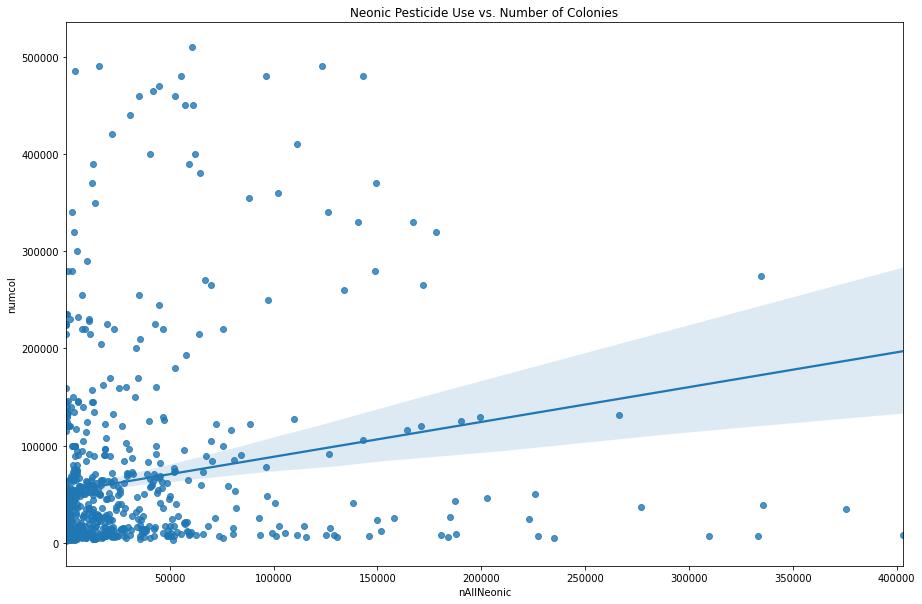

In [ ]:
sns.regplot(y = neonic.numcol, x = neonic.nAllNeonic).set(title = 'Neonic Pesticide Use vs. Number of Colonies')


**Yield Per Colony vs. All Neonic Pesticides Usage**

In [ ]:
LR_2 = stats.linregress(y = neonic.yieldpercol, x = neonic.nAllNeonic)
LR_2

LinregressResult(slope=-1.5550435386576396e-05, intercept=60.15922399883636, rvalue=-0.042028055902412625, pvalue=0.24686346644327037, stderr=1.3418329897648701e-05)

In [ ]:
slope = LR_2.slope
intercept = LR_2.intercept
standard_error = LR_2.stderr

print('slope:',slope,'intercept:',intercept,'standard_error:',standard_error)

slope: -1.5550435386576396e-05 intercept: 60.15922399883636 standard_error: 1.3418329897648701e-05


[Text(0.5, 1.0, 'Neonic Pesticide Use vs. Yield Per Colony')]

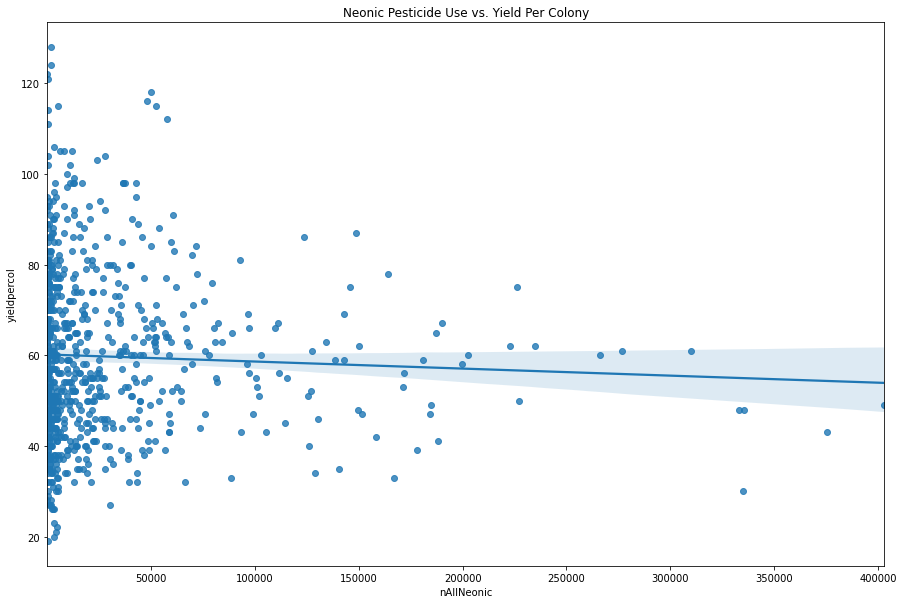

In [ ]:
sns.regplot(y = neonic.yieldpercol, x = neonic.nAllNeonic).set(title = 'Neonic Pesticide Use vs. Yield Per Colony')

**Total Production vs. All Neonic Pesticides Usage**

In [ ]:
LR_3 = stats.linregress(y = neonic.totalprod, x = neonic.nAllNeonic)
LR_3

LinregressResult(slope=16.715000054220717, intercept=3759029.4536212743, rvalue=0.12028780301605162, pvalue=0.0008844651047092742, stderr=5.007246966202884)

In [ ]:
slope = LR_3.slope
intercept = LR_3.intercept
standard_error = LR_3.stderr

print('slope:',slope,'intercept:',intercept,'standard_error:',standard_error)

slope: 16.715000054220717 intercept: 3759029.4536212743 standard_error: 5.007246966202884


[Text(0.5, 1.0, 'Neonic Pesticide Use vs. Total Honey Production')]

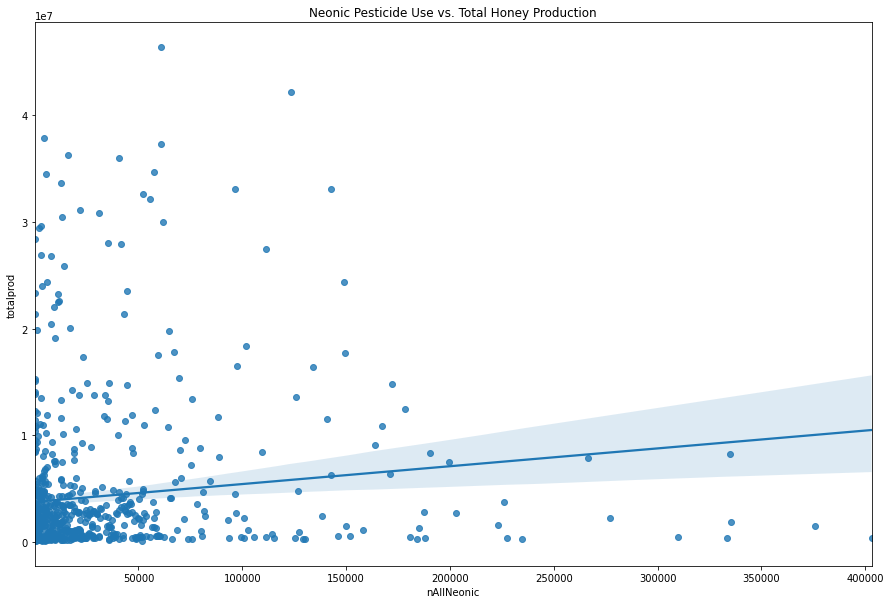

In [ ]:
sns.regplot(y = neonic.totalprod, x = neonic.nAllNeonic).set(title = 'Neonic Pesticide Use vs. Total Honey Production')

### **Country Level Correlation Table**

In [ ]:
reg_corr_df = neonic.copy()
reg_corr_df = reg_corr_df[['numcol','yieldpercol','totalprod','nAllNeonic']]
reg_corr_df

,numcol,yieldpercol,totalprod,nAllNeonic
0,11000.0,56,616000.0,15103.9
1,11000.0,72,792000.0,10281.8
2,12000.0,86,1032000.0,2019.2
3,12000.0,87,1044000.0,7864.2
4,13000.0,66,858000.0,7992.0
...,...,...,...,...
820,40000.0,68,2720000.0,36.9
821,43000.0,80,3440000.0,396.8
822,46000.0,60,2760000.0,91.2
823,47000.0,66,3102000.0,1523.0


Text(0.5, 1.0, 'Neonic Pesticide Usage vs. Number of Colonies, Yield Per Colony, and Total Production')

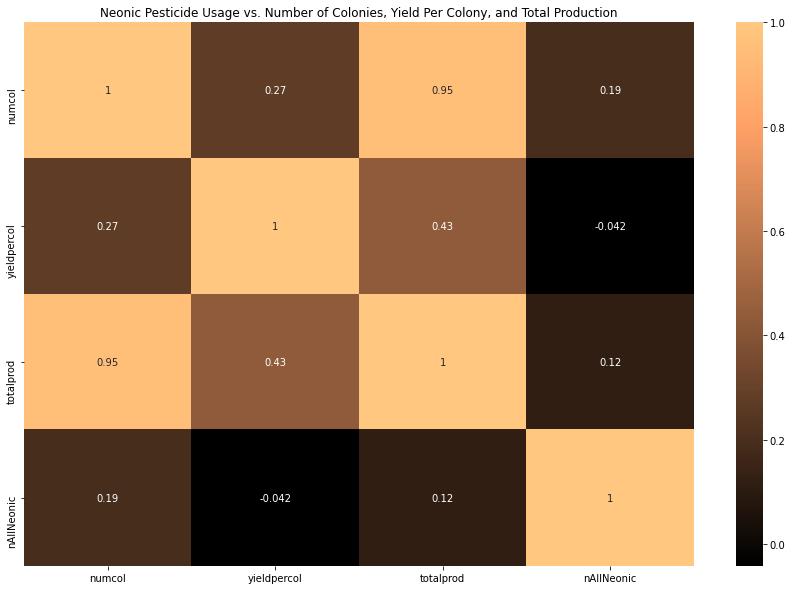

In [ ]:
plt.figure(figsize=(15,10))
heatmap = sns.heatmap(reg_corr_df.corr(),annot = True,cmap="copper")
heatmap.set_title('Neonic Pesticide Usage vs. Number of Colonies, Yield Per Colony, and Total Production')

State                       0
Honey producing colonies    2
Yield per colony            0
Production                  0
Stocks December 15          0
Average price per pound     0
Value of production         0
Year                        0
dtype: int64
state             0
numcol            0
yieldpercol       0
totalprod         0
stocks            0
priceperlb        0
prodvalue         0
year              0
StateName         0
Region            0
nCLOTHIANIDIN    64
nIMIDACLOPRID    64
nTHIAMETHOXAM    64
nACETAMIPRID     64
nTHIACLOPRID     64
nAllNeonic       64
dtype: int64


/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)
/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and ma

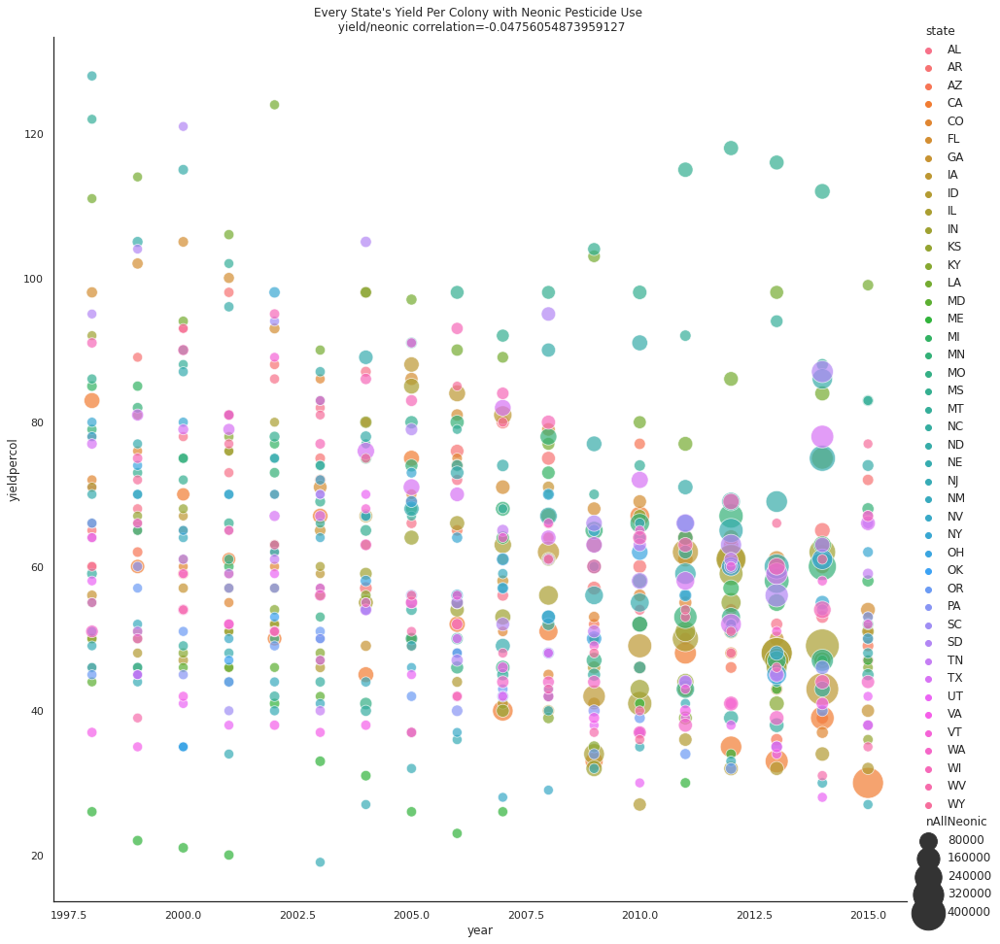

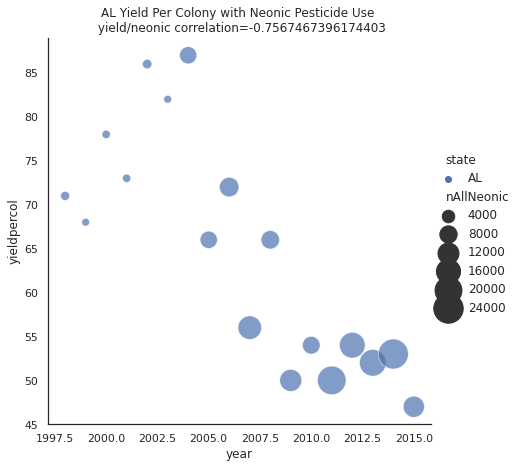

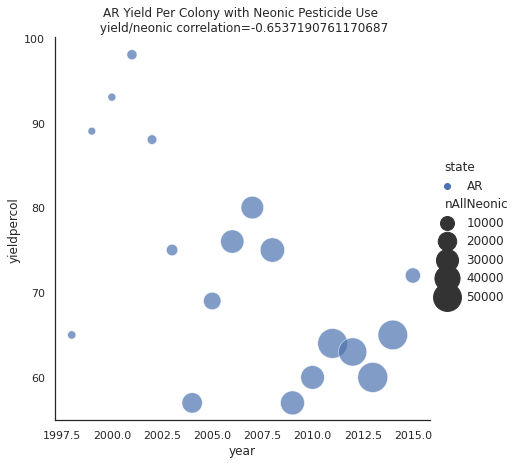

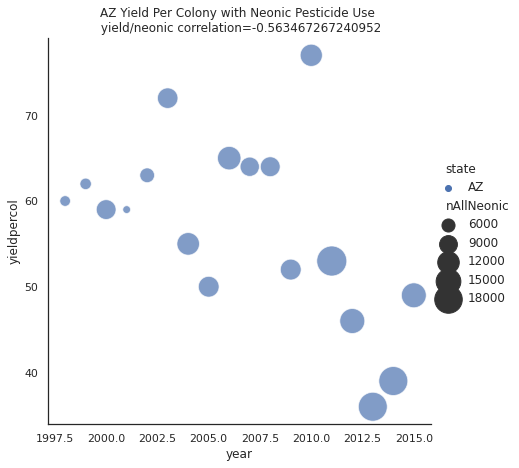

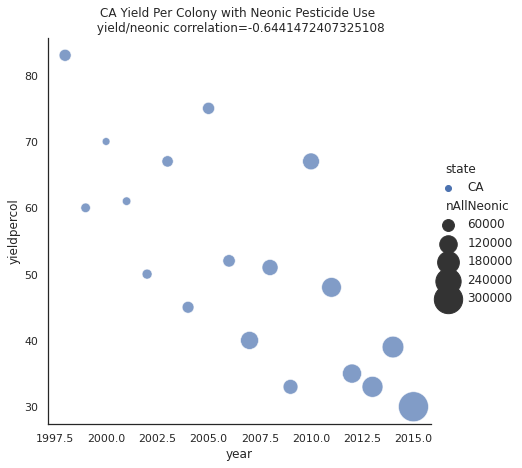

...

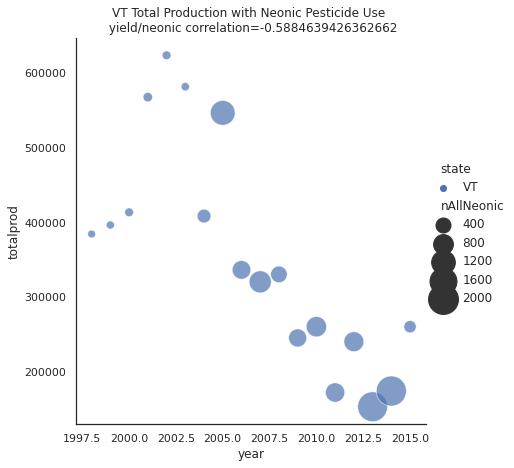

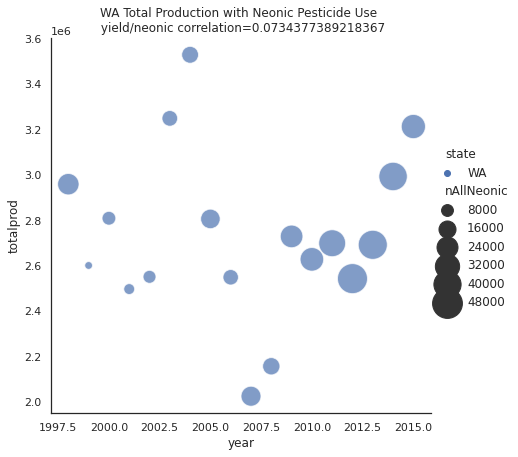

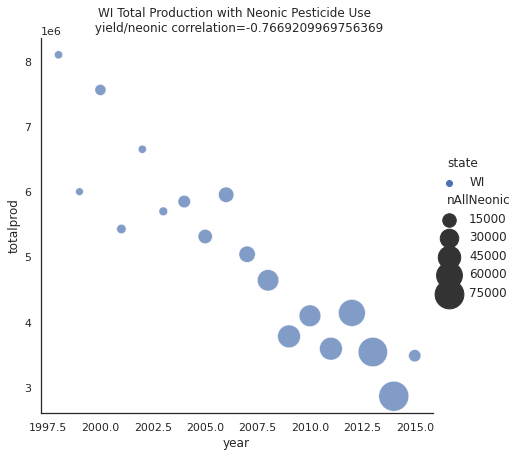

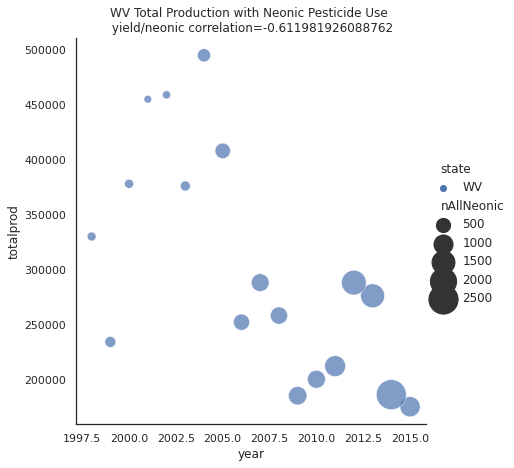

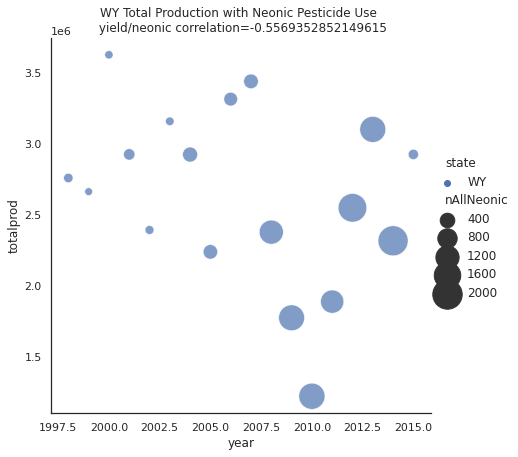

In [ ]:
honey = clean_data_csv("honey.csv")
neonic = clean_data_csv("vHoneyNeonic_v02.csv")

sns.set_theme(style='white')

# as we saw in previous exploration graphs, neonic use was high between 1990s and 2015
rows_wrong_years = neonic[(neonic['year'] < 1995) | (neonic['year'] > 2015)].index
high_neonic_years = neonic.drop(rows_wrong_years)

# ----------------------- yield per col ---------------------------------------

# all states 
corr_val = high_neonic_years['nAllNeonic'].corr(high_neonic_years['yieldpercol'])
sns.relplot(y='yieldpercol', x='year', hue='state', size='nAllNeonic', 
            sizes=(100, 1200), height=13, alpha=.7, data=high_neonic_years)
title = "Every State's Yield Per Colony with Neonic Pesticide Use \n yield/neonic correlation=" + str(corr_val)
plt.title(title)

# for each state calculate yield per colony 
for state in high_neonic_years.state.unique():
  non_matching_rows = high_neonic_years[high_neonic_years['state'] != state].index
  state_specific = high_neonic_years.drop(non_matching_rows)
  corr_val = state_specific['yieldpercol'].corr(state_specific['nAllNeonic'])

  sns.relplot(y='yieldpercol', x='year', hue='state', size='nAllNeonic', 
            sizes=(60, 900), height=6, alpha=.7, data=state_specific)
  title = state + " Yield Per Colony with Neonic Pesticide Use \n yield/neonic correlation=" + str(corr_val)
  plt.title(title)

# --------------------- total prod -------------------------------------

# all states 
corr_val = high_neonic_years['nAllNeonic'].corr(high_neonic_years['totalprod'])
sns.relplot(y='totalprod', x='year', hue='state', size='nAllNeonic', 
            sizes=(100, 1200), height=13, alpha=.7, data=high_neonic_years)
title = "Every State's Total Production with Neonic Pesticide Use \n yield/neonic correlation=" + str(corr_val)
plt.title(title)

for state in high_neonic_years.state.unique():
  non_matching_rows = high_neonic_years[high_neonic_years['state'] != state].index
  state_specific = high_neonic_years.drop(non_matching_rows)
  corr_val = state_specific['totalprod'].corr(state_specific['nAllNeonic'])

  sns.relplot(y='totalprod', x='year', hue='state', size='nAllNeonic', 
            sizes=(60, 900), height=6, alpha=.7, data=state_specific)
  title = state + " Total Production with Neonic Pesticide Use \n yield/neonic correlation=" + str(corr_val)
  plt.title(title)

""" These graphs illustrate that on a national level pesticide use doesn't seem to have a strong correlation with honey yield per colony. However, individual states seem to have very strong positive or negative correlations to look deeper into these state-by-state correlations, the next code block will explore a map of correlation trends on a geopandas map to explore the possibility that certain regions respond well to pesticide use while others may not."""


# **Understanding the other factors affecting the Ecosystem for Bees**

State                        0
Varroa mites                 0
Other pests and parasites    0
Diseases                     0
Pesticides                   0
Other                        0
Unknown                      0
Year                         0
dtype: int64


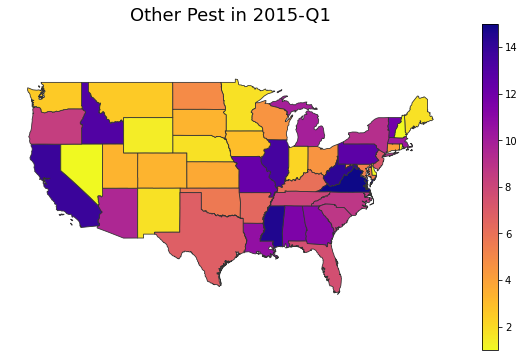

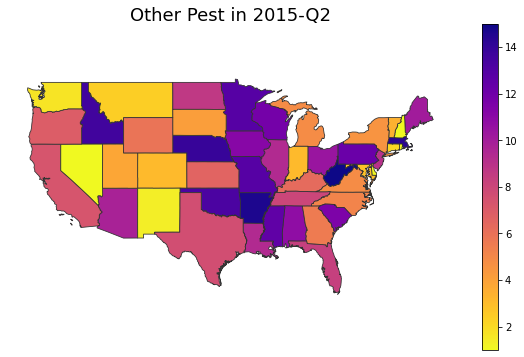

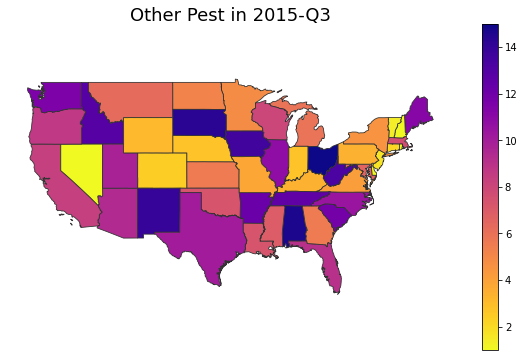

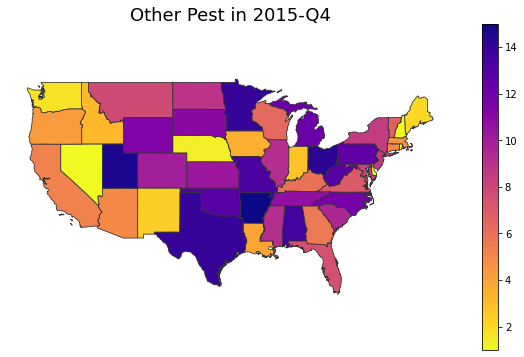

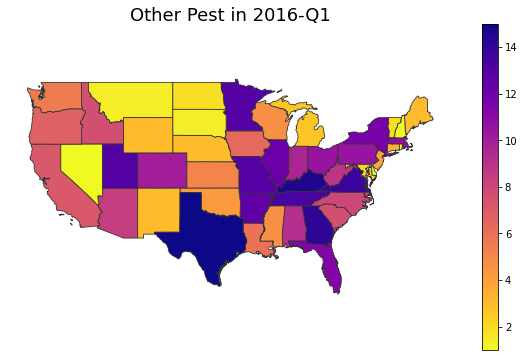

...

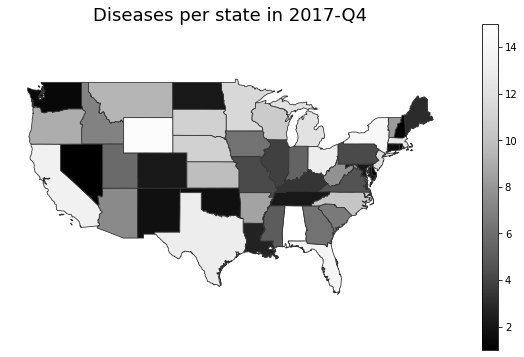

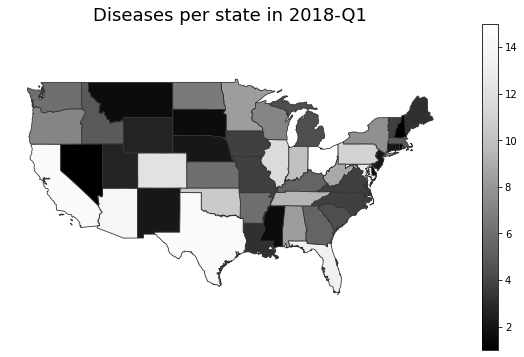

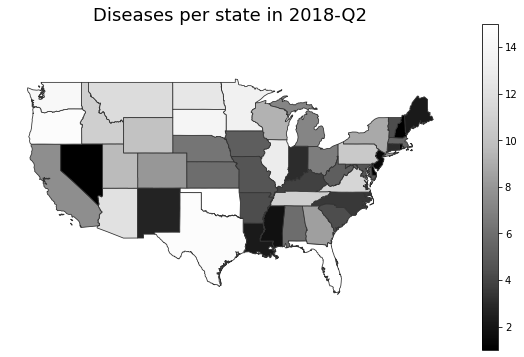

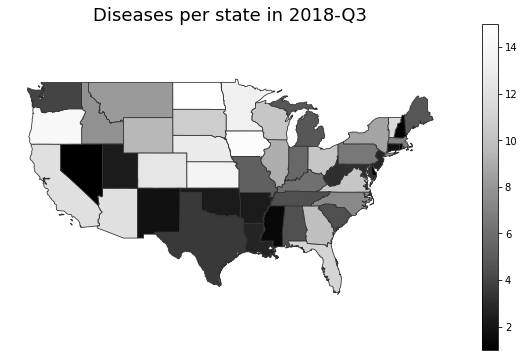

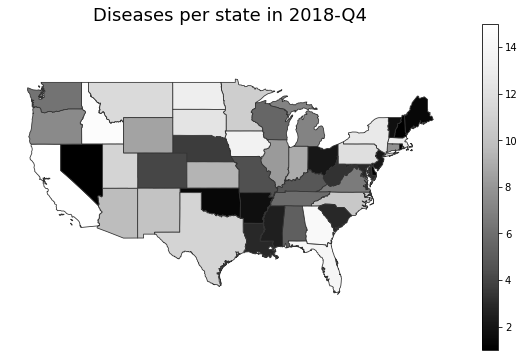

In [ ]:
honey = clean_data_csv("stressors.csv")
USA_MAP_DATA = gpd.read_file('States_shapefile.shp')



def visualize_us_map(yearly_data, var, g_title, min, max, cmap):
    states = yearly_data.State.unique()
    merged = USA_MAP_DATA.set_index('State_Code').join(yearly_data.set_index('State'))
    merged = merged.fillna(0)
    
    drop_HI = merged[(merged['FID'] == 2) | (merged['FID'] == 12)].index
    
    merged = merged.drop(drop_HI)
    
    fig, ax = plt.subplots(1, figsize=(10, 6))
    
    merged.plot(column=var, cmap=cmap, linewidth=0.8, ax=ax, edgecolor='.2')

    ax.axis('off')
    title = g_title + 'in ' + str((merged['Year'].iloc[1])) + '\n\n'
    ax.set_title(title, fontdict={'fontsize': '18', 'fontweight': '3'})

    side = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min, vmax=max))
    side._A = []
    sidebar = fig.colorbar(side)

    plt.show()

for year in honey.Year.unique():
        rows_wrong_year = honey[(honey['Year'] != year)].index
        yearly_subset = honey.drop(rows_wrong_year)

        drop_HI = yearly_subset[(yearly_subset['State'] == 'HI') | (yearly_subset['State'] == 'US')].index
        yearly_subset = yearly_subset.drop(drop_HI)
        visualize_us_map(yearly_subset, 'Other pests and parasites', 'Other Pest ', 1, 15, "plasma_r")

for year in honey.Year.unique():
        rows_wrong_year = honey[(honey['Year'] != year)].index
        yearly_subset = honey.drop(rows_wrong_year)

        drop_HI = yearly_subset[(yearly_subset['State'] == 'HI') | (yearly_subset['State'] == 'US')].index
        yearly_subset = yearly_subset.drop(drop_HI)
        visualize_us_map(yearly_subset, 'Diseases', 'Diseases per state ', 1, 15, "Greys_r")

